<a href="https://www.kaggle.com/code/klyushnik/episode-7?scriptVersionId=168417199" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/playground-series-s3e7/sample_submission.csv
/kaggle/input/playground-series-s3e7/train.csv
/kaggle/input/playground-series-s3e7/test.csv
/kaggle/input/reservation-cancellation-prediction/train__dataset.csv
/kaggle/input/reservation-cancellation-prediction/test___dataset.csv



#  **Loading data**

In [2]:
sub = pd.read_csv('/kaggle/input/playground-series-s3e7/sample_submission.csv')
test = pd.read_csv('/kaggle/input/playground-series-s3e7/test.csv')
train = pd.read_csv('/kaggle/input/playground-series-s3e7/train.csv')
train_org = pd.read_csv('/kaggle/input/reservation-cancellation-prediction/test___dataset.csv')

#   **Use it for faster data analysis**

In [3]:
#import pandas_profiling
#pandas_profiling.ProfileReport(train)

#  **Start data processing**

In [4]:
train_all = pd.concat([train, train_org]).reset_index(drop=True)

In [5]:
train_all = train_all.drop(columns =['id'])
test = test.drop(columns =['id'])

Remove NAN

In [6]:
train_all = train_all.fillna(0)

Remove uncharacteristic data, get list_columns

In [7]:
list_columns = train_all.columns
list_columns

Index(['no_of_adults', 'no_of_children', 'no_of_weekend_nights',
       'no_of_week_nights', 'type_of_meal_plan', 'required_car_parking_space',
       'room_type_reserved', 'lead_time', 'arrival_year', 'arrival_month',
       'arrival_date', 'market_segment_type', 'repeated_guest',
       'no_of_previous_cancellations', 'no_of_previous_bookings_not_canceled',
       'avg_price_per_room', 'no_of_special_requests', 'booking_status'],
      dtype='object')

Use quantile

In [8]:
def outlier_removal(data , i):
    q1 = np.quantile(data[i] ,0.25)
    q3 = np.quantile(data[i] , 0.75)
    iqr = q3-q1
    lower_tail = q1 - 1.5*iqr
    upper_tail = q3 + 1.5*iqr
    data.drop(data[data[i]> upper_tail].index , inplace = True)
    data.drop(data[data[i]< lower_tail].index ,inplace =True)
    
outlier_list = ['no_of_adults', 'no_of_children', 'no_of_weekend_nights',
       'no_of_week_nights', 'type_of_meal_plan', 'required_car_parking_space',
       'room_type_reserved', 'lead_time', 'arrival_year', 'arrival_month',
       'arrival_date', 'market_segment_type', 'repeated_guest',
       'no_of_previous_cancellations', 'no_of_previous_bookings_not_canceled',
       'avg_price_per_room', 'no_of_special_requests', 'booking_status']
for  i in outlier_list:
    outlier_removal(train_all ,i)

Thank you HWIKOOK CHOE https://www.kaggle.com/code/hwikookchoe/pgs-s3e7-eda-and-pycaret-practice#2.-Pycaret

In [9]:
from pandas.tseries.holiday import USFederalHolidayCalendar

def features(df):
    
    df['arrival_year_month'] = pd.to_datetime(df['arrival_year'].astype(str) + df['arrival_month'].astype(str), format='%Y%m')
    df.loc[df.arrival_date > df.arrival_year_month.dt.days_in_month, 'arrival_date'] = df.loc[df.arrival_date > df.arrival_year_month.dt.days_in_month, 'arrival_year_month'].dt.days_in_month
    df.drop(columns='arrival_year_month', inplace=True)
        
    df['arrival_full_date'] = (df['arrival_year'].astype(str) 
                               + '-' + df['arrival_month'].astype(str)
                               + '-' + df['arrival_date'].astype(str))
    df['arrival_full_date'] = pd.to_datetime(df.arrival_full_date)
    df['arrival_week'] = df['arrival_full_date'].dt.isocalendar().week.astype(float)
    df['arrival_dayofweek'] = df['arrival_full_date'].dt.dayofweek

    df['arrival_dayofyear'] = df['arrival_full_date'].dt.dayofyear
        
    df['no_of_adults_div_price'] = df.no_of_adults / (df.avg_price_per_room + 1e-6)
    df['no_of_children_div_price'] = df.no_of_children / (df.avg_price_per_room + 1e-6)
    df['lead_time_div_price'] = df.lead_time / (df.avg_price_per_room + 1e-6)
    df.drop(columns=['arrival_full_date'], inplace=True)
    return df 

In [10]:
features(train_all)

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,...,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status,arrival_week,arrival_dayofweek,arrival_dayofyear,no_of_adults_div_price,no_of_children_div_price,lead_time_div_price
1,2,0,1,2,0,0,0,117,2018,7,...,0,72.25,0,0.0,30.0,6,210,0.027682,0.0,1.619377
2,2,0,0,1,0,0,0,315,2018,12,...,0,52.00,0,0.0,48.0,6,336,0.038462,0.0,6.057692
4,2,0,1,0,0,0,0,258,2018,10,...,0,100.00,0,1.0,42.0,1,289,0.020000,0.0,2.580000
8,2,0,2,3,0,0,0,189,2018,10,...,0,72.75,0,0.0,41.0,0,281,0.027491,0.0,2.597938
15,2,0,1,2,0,0,0,143,2018,4,...,0,77.03,1,0.0,16.0,6,112,0.025964,0.0,1.856420
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60232,2,0,1,0,0,0,0,44,2018,6,...,0,99.10,1,0.0,25.0,1,170,0.020182,0.0,0.443996
60233,2,0,1,3,0,0,1,37,2018,3,...,0,95.40,1,0.0,11.0,2,73,0.020964,0.0,0.387841
60235,2,0,2,2,0,0,0,144,2018,7,...,0,112.00,0,0.0,27.0,1,184,0.017857,0.0,1.285714
60236,2,0,0,2,0,0,1,30,2018,3,...,0,116.30,1,0.0,9.0,6,63,0.017197,0.0,0.257954


In [11]:
features(test)

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,...,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,arrival_week,arrival_dayofweek,arrival_dayofyear,no_of_adults_div_price,no_of_children_div_price,lead_time_div_price
0,3,0,1,4,0,0,1,111,2018,12,...,0,0,115.60,2,49.0,2,339,0.025952,0.000000,0.960208
1,2,0,0,3,0,0,0,22,2017,10,...,0,0,85.00,0,42.0,5,294,0.023529,0.000000,0.258824
2,2,2,0,1,0,0,3,18,2018,8,...,0,0,240.00,1,32.0,4,222,0.008333,0.008333,0.075000
3,2,0,0,3,0,0,0,88,2018,5,...,0,0,80.75,0,22.0,2,150,0.024768,0.000000,1.089783
4,1,0,0,2,2,0,0,7,2018,9,...,0,0,144.00,0,38.0,4,264,0.006944,0.000000,0.048611
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28063,2,0,1,2,0,0,0,315,2018,9,...,0,0,160.00,0,39.0,6,273,0.012500,0.000000,1.968750
28064,2,0,2,2,0,0,0,81,2018,3,...,0,0,65.00,1,12.0,6,84,0.030769,0.000000,1.246154
28065,2,0,1,2,0,0,0,40,2018,10,...,0,0,85.00,0,43.0,0,295,0.023529,0.000000,0.470588
28066,3,0,0,4,0,0,1,4,2018,9,...,0,0,162.75,0,36.0,3,249,0.018433,0.000000,0.024578


# **Split the dataset into training and test**

In [12]:
X = train_all.drop(columns = ['booking_status'])
y = train_all.booking_status

In [13]:
from sklearn.model_selection import train_test_split, KFold
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.45, random_state=42)

# **Load the packages**

In [14]:
import optuna

import sklearn.model_selection
import sklearn.svm
import itertools
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt 


# **Classification**

In [15]:
def plot_classification_report(classificationReport,
                               title='Classification report',
                               cmap='RdBu'):

    classificationReport = classificationReport.replace('\n\n', '\n')
    classificationReport = classificationReport.replace(' / ', '/')
    lines = classificationReport.split('\n')
    
    classes, plotMat, support, class_names = [], [], [], []
    for line in lines[1 : (len(lines) - 4)]:  # if you don't want avg/total result, then change [1:] into [1:-1]
        t = line.strip().replace(' avg', '-avg').split()
        if len(t) < 2:
            continue
        classes.append(t[0])
        v = [float(x) for x in t[1: len(t) - 1]]
        support.append(int(t[-1]))
        class_names.append(t[0])
        plotMat.append(v)

    plotMat = np.array(plotMat)
    xticklabels = ['Precision', 'Recall', 'F1-score']
    yticklabels = ['{0} ({1})'.format(class_names[idx], sup)
                   for idx, sup in enumerate(support)]
    
    plt.figure(figsize=(10,10))

    plt.imshow(plotMat, interpolation='nearest', cmap=cmap, aspect='auto')
    plt.title(title)
    plt.colorbar()
    plt.xticks(np.arange(3), xticklabels, rotation=45)
    plt.yticks(np.arange(len(classes)), yticklabels)

    upper_thresh = plotMat.min() + (plotMat.max() - plotMat.min()) / 10 * 8
    lower_thresh = plotMat.min() + (plotMat.max() - plotMat.min()) / 10 * 2
    for i, j in itertools.product(range(plotMat.shape[0]), range(plotMat.shape[1])):
        plt.text(j, i, format(plotMat[i, j], '.2f'),
                 horizontalalignment="center",
                 color="white" if (plotMat[i, j] > upper_thresh or plotMat[i, j] < lower_thresh) else "black")

    plt.ylabel('Classes')
    plt.xlabel('Metrics')
    plt.tight_layout()

# **SVR**

In [16]:
def objective(trial):

    svc_c = trial.suggest_float("C", 1e-10, 1e10, log=True)
    classifier_obj = sklearn.svm.SVC(C=svc_c, gamma="auto")

    score = sklearn.model_selection.cross_val_score(classifier_obj, X_train, y_train, n_jobs=-1, cv=3)
    accuracy = score.mean()
    return accuracy

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=50)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-23 11:59:52,189] A new study created in memory with name: no-name-d852993a-0ca8-4aa7-9710-16b77d76be32
[I 2024-03-23 12:00:05,235] Trial 0 finished with value: 0.6954731713680272 and parameters: {'C': 2664.428950733705}. Best is trial 0 with value: 0.6954731713680272.
[I 2024-03-23 12:00:16,819] Trial 1 finished with value: 0.6962605535811416 and parameters: {'C': 81.61383802708252}. Best is trial 1 with value: 0.6962605535811416.
[I 2024-03-23 12:00:23,038] Trial 2 finished with value: 0.6687007809820078 and parameters: {'C': 5.627744539405248e-10}. Best is trial 1 with value: 0.6962605535811416.
[I 2024-03-23 12:00:28,871] Trial 3 finished with value: 0.6687007809820078 and parameters: {'C': 4.5257592421874305e-08}. Best is trial 1 with value: 0.6962605535811416.
[I 2024-03-23 12:00:40,312] Trial 4 finished with value: 0.6954731713680272 and parameters: {'C': 58993711.234759726}. Best is trial 1 with value: 0.6962605535811416.
[I 2024-03-23 12:00:46,133] Trial 5 finished w

Number of finished trials: 50
Best trial:
  Value: 0.6986222642391926
  Params: 
    C: 1.0795388931882082


              precision    recall  f1-score   support

         0.0       0.73      0.92      0.81      8383
         1.0       0.63      0.29      0.39      4036

    accuracy                           0.71     12419
   macro avg       0.68      0.60      0.60     12419
weighted avg       0.69      0.71      0.68     12419



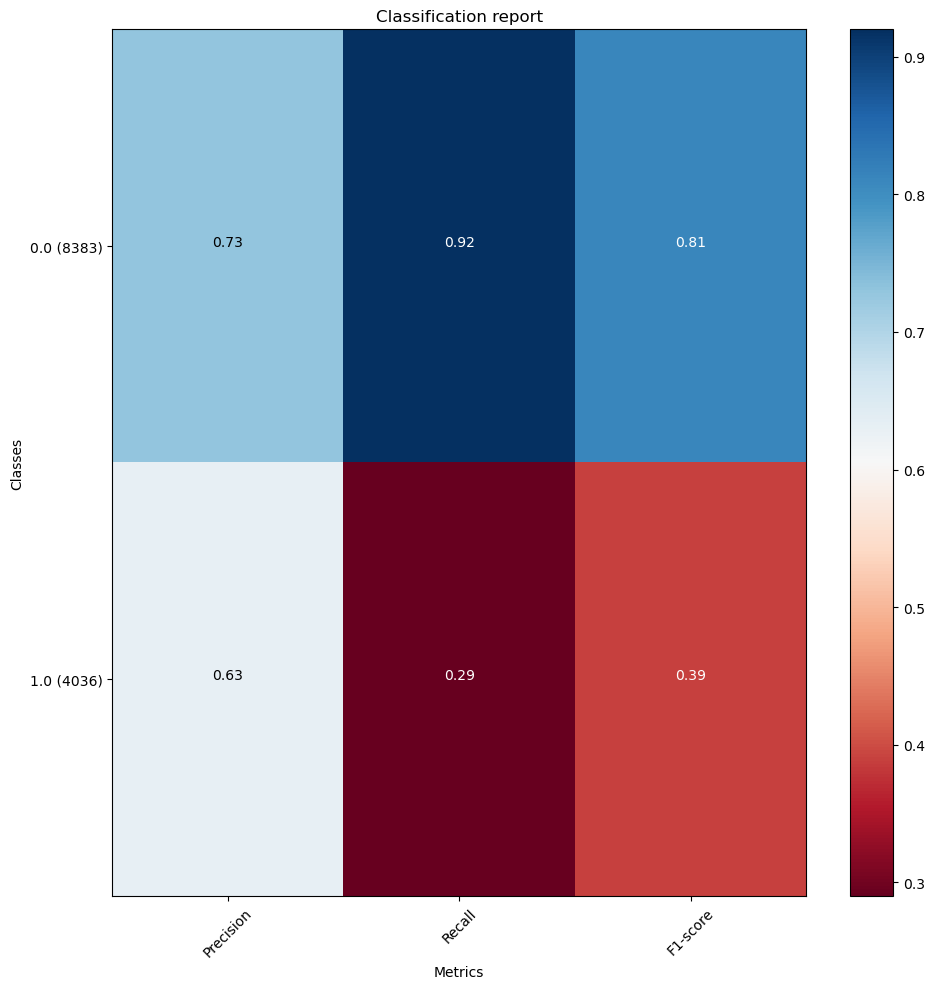

In [17]:
svc_c = study.best_params['C']
model = sklearn.svm.SVC(C=svc_c, gamma="auto")
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
clf =classification_report(y_test, y_pred)
plot_classification_report(clf)
print(clf)

# **Catboost**

In [18]:
import catboost
import pickle
from sklearn.metrics import accuracy_score
def objective(trial):
    model = catboost.CatBoostClassifier(
        iterations=trial.suggest_int("iterations", 100, 1000),
        learning_rate=trial.suggest_float("learning_rate", 1e-3, 1e-1, log=True),
        depth=trial.suggest_int("depth", 4, 10),
        l2_leaf_reg=trial.suggest_float("l2_leaf_reg", 1e-8, 100.0, log=True),
        bootstrap_type=trial.suggest_categorical("bootstrap_type", ["Bayesian"]),
        random_strength=trial.suggest_float("random_strength", 1e-8, 10.0, log=True),
        bagging_temperature=trial.suggest_float("bagging_temperature", 0.0, 10.0),
        od_type=trial.suggest_categorical("od_type", ["IncToDec", "Iter"]),
        od_wait=trial.suggest_int("od_wait", 10, 50),
        verbose=False
    )
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    return accuracy


study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-23 12:08:08,064] A new study created in memory with name: no-name-109a9c3a-8290-49d0-88fc-06e4ea1760f0
[I 2024-03-23 12:08:11,263] Trial 0 finished with value: 0.7961188501489653 and parameters: {'iterations': 398, 'learning_rate': 0.04634647352725299, 'depth': 7, 'l2_leaf_reg': 0.010583248029295387, 'bootstrap_type': 'Bayesian', 'random_strength': 1.0611430049232479e-05, 'bagging_temperature': 0.9536058048297924, 'od_type': 'IncToDec', 'od_wait': 41}. Best is trial 0 with value: 0.7961188501489653.
[I 2024-03-23 12:08:22,574] Trial 1 finished with value: 0.7812223206377326 and parameters: {'iterations': 942, 'learning_rate': 0.005665285238752957, 'depth': 8, 'l2_leaf_reg': 39.163506673762384, 'bootstrap_type': 'Bayesian', 'random_strength': 0.3605421964457763, 'bagging_temperature': 6.6066657013373975, 'od_type': 'IncToDec', 'od_wait': 26}. Best is trial 0 with value: 0.7961188501489653.
[I 2024-03-23 12:08:28,886] Trial 2 finished with value: 0.7771962315806425 and paramet

Number of finished trials: 100
Best trial:
  Value: 0.7970851115226669
  Params: 
    iterations: 913
    learning_rate: 0.03361540514127282
    depth: 7
    l2_leaf_reg: 4.524359176426276
    bootstrap_type: Bayesian
    random_strength: 1.7995001614346617e-06
    bagging_temperature: 0.5791457041118828
    od_type: IncToDec
    od_wait: 26


0:	learn: 0.6746183	total: 9.53ms	remaining: 8.69s
1:	learn: 0.6574790	total: 17.5ms	remaining: 7.95s
2:	learn: 0.6419607	total: 24.7ms	remaining: 7.5s
3:	learn: 0.6279498	total: 33ms	remaining: 7.49s
4:	learn: 0.6148621	total: 40.4ms	remaining: 7.33s
5:	learn: 0.6029191	total: 48.4ms	remaining: 7.31s
6:	learn: 0.5929179	total: 56.2ms	remaining: 7.28s
7:	learn: 0.5825588	total: 63.7ms	remaining: 7.21s
8:	learn: 0.5731537	total: 70.8ms	remaining: 7.11s
9:	learn: 0.5647004	total: 78.6ms	remaining: 7.09s
10:	learn: 0.5573191	total: 85.7ms	remaining: 7.03s
11:	learn: 0.5502954	total: 93.4ms	remaining: 7.01s
12:	learn: 0.5435952	total: 103ms	remaining: 7.13s
13:	learn: 0.5378877	total: 111ms	remaining: 7.12s
14:	learn: 0.5325959	total: 119ms	remaining: 7.12s
15:	learn: 0.5275631	total: 127ms	remaining: 7.1s
16:	learn: 0.5229127	total: 134ms	remaining: 7.06s
17:	learn: 0.5186309	total: 141ms	remaining: 7.02s
18:	learn: 0.5146333	total: 149ms	remaining: 7s
19:	learn: 0.5104122	total: 156ms	re

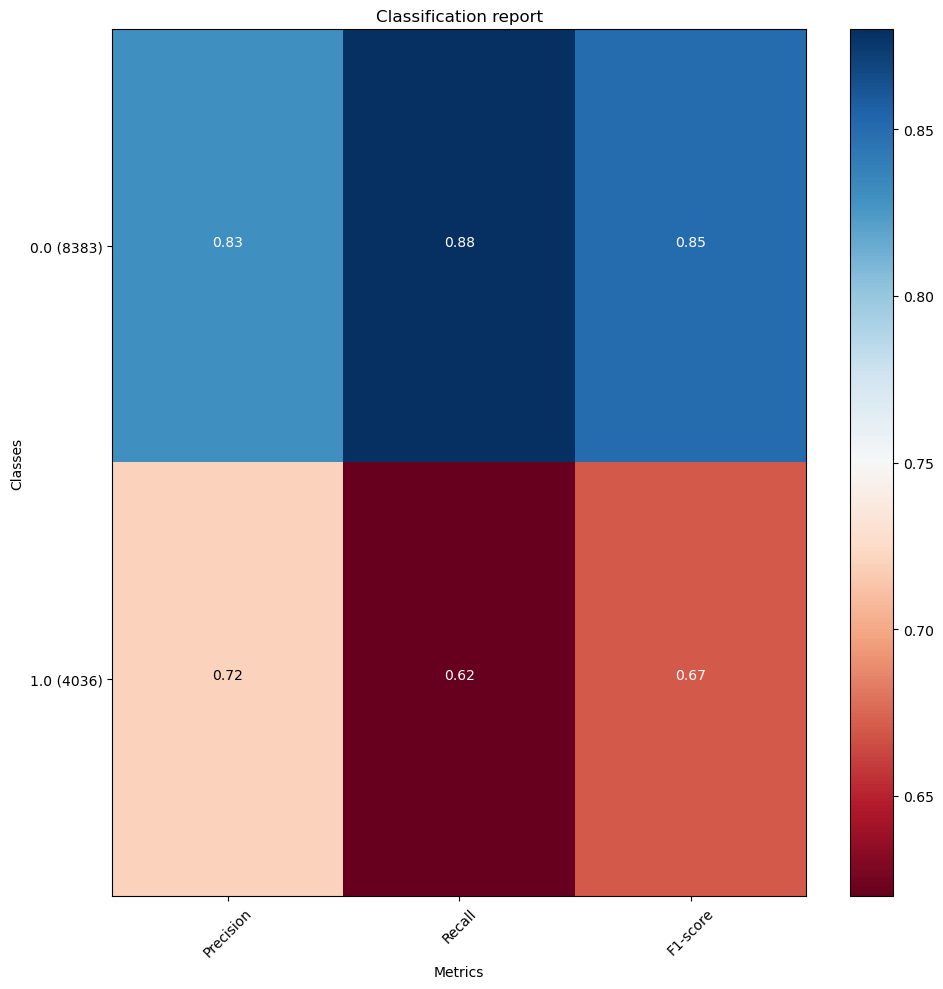

In [19]:
ct_best = study.best_params
model = catboost.CatBoostClassifier(**ct_best)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
clf =classification_report(y_test, y_pred)
plot_classification_report(clf)
print(clf)

# **Light GBM**

In [20]:
import lightgbm as lgb

train_y_label = y_train
valid_y_label = y_test
dtrain = lgb.Dataset(X_train, label=train_y_label)

# FYI: Objective functions can take additional arguments
# (https://optuna.readthedocs.io/en/stable/faq.html#objective-func-additional-args).
def objective(trial):
    param = {
        'objective': 'binary',
        'metric': 'binary_logloss',
        'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
        'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
        'num_leaves': trial.suggest_int('num_leaves', 2, 256),
        'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
        'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 1, 7),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'feature_pre_filter' : False
    }

    gbm = lgb.train(param, dtrain)
    preds = gbm.predict(X_test)
    pred_labels = []
    for i in range(0,len(preds)):
        pred_labels.append(np.argmax(preds[i]))
    accuracy = cal_acc(valid_y_label, pred_labels)
    return accuracy

def cal_acc(true, pred):
    return np.mean(true==pred)

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=50)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-23 12:18:04,634] A new study created in memory with name: no-name-6b5a7fbb-efd2-46c5-bdcd-b2f80cfd3c7c
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  del sys.path[0]
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  
/opt/conda/lib/p

[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:18:10,048] Trial 0 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.7986843498044502, 'lambda_l2': 0.9312527343168427, 'num_leaves': 232, 'feature_fraction': 0.48852642704191435, 'bagging_fraction': 0.711290977934606, 'bagging_freq': 6, 'min_child_samples': 11}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:18:12,141] Trial 1 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 1.8869444206451065, 'lambda_l2': 0.6833741283048927, 'num_leaves': 119, 'feature_fraction': 0.7384097050297207, 'bagging_fraction': 0.8840794014584521, 'bagging_freq': 4, 'min_child_samples': 64}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-03-23 12:18:14,195] Trial 2 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.0016401634380900914, 'lambda_l2': 1.2936306227573972e-08, 'num_leaves': 216, 'feature_fraction': 0.970918382149229, 'bagging_fraction': 0.7505243181355534, 'bagging_freq': 1, 'min_child_samples': 76}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:18:16,093] Trial 3 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.0684519832638349, 'lambda_l2': 0.0010925137350723166, 'num_leaves': 96, 'feature_fraction': 0.44340731454893717, 'bagging_fraction': 0.6352639278340387, 'bagging_freq': 7, 'min_child_samples': 57}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:18:17,359] Trial 4 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.005636319861737928, 'lambda_l2': 0.19377025276875082, 'num_leaves': 74, 'feature_fraction': 0.8375355512563274, 'bagging_fraction': 0.42767715955193275, 'bagging_freq': 1, 'min_child_samples': 75}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:18:19,263] Trial 5 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.006265081327401561, 'lambda_l2': 0.022497945409861463, 'num_leaves': 225, 'feature_fraction': 0.8806392089180766, 'bagging_fraction': 0.6542263250247762, 'bagging_freq': 3, 'min_child_samples': 67}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315


[I 2024-03-23 12:18:21,342] Trial 6 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.030270583386850503, 'lambda_l2': 1.6799178569667244e-06, 'num_leaves': 77, 'feature_fraction': 0.45763662667855776, 'bagging_fraction': 0.5871107102045314, 'bagging_freq': 6, 'min_child_samples': 13}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:18:22,435] Trial 7 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 6.685292451311362, 'lambda_l2': 3.1669388221125656, 'num_leaves': 120, 'feature_fraction': 0.8868658885826932, 'bagging_fraction': 0.5148773005003602, 'bagging_freq': 6, 'min_child_samples': 62}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:18:23,630] Trial 8 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.014681247569426008, 'lambda_l2': 0.00028433060939622615, 'num_leaves': 240, 'feature_fraction': 0.5228519072340628, 'bagging_fraction': 0.48907219761649984, 'bagging_freq': 4, 'min_child_samples': 83}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003003 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:18:25,743] Trial 9 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.4825743135911436, 'lambda_l2': 0.11749637828695199, 'num_leaves': 80, 'feature_fraction': 0.5313404762370569, 'bagging_fraction': 0.6225782477123358, 'bagging_freq': 3, 'min_child_samples': 75}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315


[I 2024-03-23 12:18:26,607] Trial 10 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 4.9534797950932527e-05, 'lambda_l2': 2.2555606487528057, 'num_leaves': 19, 'feature_fraction': 0.6114209257430768, 'bagging_fraction': 0.9795095805997801, 'bagging_freq': 7, 'min_child_samples': 7}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002828 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:18:27,842] Trial 11 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 8.560738814142013, 'lambda_l2': 5.193497388093532, 'num_leaves': 168, 'feature_fraction': 0.691294611727693, 'bagging_fraction': 0.812676645983013, 'bagging_freq': 5, 'min_child_samples': 36}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315


[I 2024-03-23 12:18:31,461] Trial 12 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 6.104760148257014e-07, 'lambda_l2': 0.016551957197124132, 'num_leaves': 164, 'feature_fraction': 0.6802292214858856, 'bagging_fraction': 0.8598495504885943, 'bagging_freq': 4, 'min_child_samples': 36}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:18:32,886] Trial 13 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.5556422882182072, 'lambda_l2': 8.422934737572165, 'num_leaves': 164, 'feature_fraction': 0.7683935221907224, 'bagging_fraction': 0.7370082284707417, 'bagging_freq': 5, 'min_child_samples': 96}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000571 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-03-23 12:18:37,743] Trial 14 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.00018101121369357536, 'lambda_l2': 0.23137498347252294, 'num_leaves': 193, 'feature_fraction': 0.40410149564876363, 'bagging_fraction': 0.891531925202883, 'bagging_freq': 3, 'min_child_samples': 42}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315


[I 2024-03-23 12:18:38,758] Trial 15 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.7442215787718727, 'lambda_l2': 0.002024821894059046, 'num_leaves': 29, 'feature_fraction': 0.6188947802870215, 'bagging_fraction': 0.7751215432255915, 'bagging_freq': 5, 'min_child_samples': 22}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:18:40,415] Trial 16 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 9.05584322927, 'lambda_l2': 0.6796837175136421, 'num_leaves': 128, 'feature_fraction': 0.7608353419628899, 'bagging_fraction': 0.9836449022163304, 'bagging_freq': 2, 'min_child_samples': 47}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315


[I 2024-03-23 12:18:45,244] Trial 17 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.1652990486028882, 'lambda_l2': 0.028420687028382796, 'num_leaves': 195, 'feature_fraction': 0.6011722635475358, 'bagging_fraction': 0.7105034938700285, 'bagging_freq': 6, 'min_child_samples': 23}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:18:46,620] Trial 18 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 1.3913497770311567, 'lambda_l2': 9.068539689279401, 'num_leaves': 253, 'feature_fraction': 0.5405071672753095, 'bagging_fraction': 0.8367249137944789, 'bagging_freq': 4, 'min_child_samples': 96}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315


[I 2024-03-23 12:18:48,013] Trial 19 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.0830829340475189, 'lambda_l2': 0.8709892283332058, 'num_leaves': 45, 'feature_fraction': 0.7451832047088496, 'bagging_fraction': 0.917630032053353, 'bagging_freq': 5, 'min_child_samples': 52}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002845 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315


[I 2024-03-23 12:18:51,359] Trial 20 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.0013276786234982605, 'lambda_l2': 0.5654593855428419, 'num_leaves': 143, 'feature_fraction': 0.6897015095382067, 'bagging_fraction': 0.7900097103823882, 'bagging_freq': 2, 'min_child_samples': 28}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:18:53,198] Trial 21 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 2.380421709178966e-05, 'lambda_l2': 1.2918757276022825e-08, 'num_leaves': 214, 'feature_fraction': 0.9767257017754332, 'bagging_fraction': 0.732279272610546, 'bagging_freq': 1, 'min_child_samples': 83}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:18:55,316] Trial 22 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.0013857421310333718, 'lambda_l2': 5.7718186928171745e-05, 'num_leaves': 198, 'feature_fraction': 0.9988552733271918, 'bagging_fraction': 0.6929968934617751, 'bagging_freq': 2, 'min_child_samples': 64}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000720 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-03-23 12:18:58,456] Trial 23 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.043246832314023737, 'lambda_l2': 1.9515628945892384e-08, 'num_leaves': 236, 'feature_fraction': 0.7993850082010863, 'bagging_fraction': 0.7923976844664427, 'bagging_freq': 7, 'min_child_samples': 75}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000840 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-03-23 12:19:00,539] Trial 24 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 1.3742983563931617, 'lambda_l2': 1.5062149185961635e-05, 'num_leaves': 109, 'feature_fraction': 0.936228986582903, 'bagging_fraction': 0.8597348631964263, 'bagging_freq': 1, 'min_child_samples': 87}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:19:03,181] Trial 25 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.2050178267772222, 'lambda_l2': 2.1509972011096767e-07, 'num_leaves': 146, 'feature_fraction': 0.8136965065481074, 'bagging_fraction': 0.7560140547146377, 'bagging_freq': 6, 'min_child_samples': 55}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003035 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:19:04,834] Trial 26 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 2.4607286629551317, 'lambda_l2': 0.003572972328099057, 'num_leaves': 216, 'feature_fraction': 0.8778744085083688, 'bagging_fraction': 0.6882508107642002, 'bagging_freq': 4, 'min_child_samples': 68}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002695 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:19:06,647] Trial 27 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.17623587051087675, 'lambda_l2': 4.520214146793522e-06, 'num_leaves': 179, 'feature_fraction': 0.9333258401719075, 'bagging_fraction': 0.8189644853137974, 'bagging_freq': 2, 'min_child_samples': 88}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:19:09,563] Trial 28 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.01584306106559769, 'lambda_l2': 0.00014127633295096684, 'num_leaves': 149, 'feature_fraction': 0.6499079137784636, 'bagging_fraction': 0.7709632746914958, 'bagging_freq': 3, 'min_child_samples': 48}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000788 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315


[I 2024-03-23 12:19:11,571] Trial 29 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.09902527829275849, 'lambda_l2': 0.0007005405204181996, 'num_leaves': 56, 'feature_fraction': 0.726713507525421, 'bagging_fraction': 0.9409252047213195, 'bagging_freq': 7, 'min_child_samples': 60}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002997 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:19:13,727] Trial 30 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 1.403032354187952, 'lambda_l2': 0.00272298840955526, 'num_leaves': 101, 'feature_fraction': 0.7240774058366963, 'bagging_fraction': 0.8654310660624293, 'bagging_freq': 5, 'min_child_samples': 74}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:19:15,697] Trial 31 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.003988241634550912, 'lambda_l2': 0.11002976123299808, 'num_leaves': 90, 'feature_fraction': 0.8369262651141272, 'bagging_fraction': 0.6149719830868727, 'bagging_freq': 7, 'min_child_samples': 59}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003053 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:19:17,924] Trial 32 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.2999874362575848, 'lambda_l2': 3.693678866888256e-05, 'num_leaves': 255, 'feature_fraction': 0.45561227526586157, 'bagging_fraction': 0.6714061761502239, 'bagging_freq': 6, 'min_child_samples': 55}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:19:20,109] Trial 33 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.040339998571095, 'lambda_l2': 0.016520543498984082, 'num_leaves': 112, 'feature_fraction': 0.7955756343494457, 'bagging_fraction': 0.7166185280359828, 'bagging_freq': 7, 'min_child_samples': 71}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315


[I 2024-03-23 12:19:21,861] Trial 34 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.00910746119207844, 'lambda_l2': 1.6040691127019864e-06, 'num_leaves': 62, 'feature_fraction': 0.4037216350197899, 'bagging_fraction': 0.6646458443354708, 'bagging_freq': 6, 'min_child_samples': 67}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:19:23,045] Trial 35 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 3.041776733807012, 'lambda_l2': 0.00014613578160628152, 'num_leaves': 93, 'feature_fraction': 0.573397906869328, 'bagging_fraction': 0.5824571030228196, 'bagging_freq': 6, 'min_child_samples': 82}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:19:25,500] Trial 36 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.053697334600304625, 'lambda_l2': 1.9271369383690542, 'num_leaves': 123, 'feature_fraction': 0.48842552553737717, 'bagging_fraction': 0.6357465847821979, 'bagging_freq': 1, 'min_child_samples': 40}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:19:27,214] Trial 37 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.42783960404637383, 'lambda_l2': 0.052802359525288625, 'num_leaves': 226, 'feature_fraction': 0.6500125538517737, 'bagging_fraction': 0.753358459209136, 'bagging_freq': 7, 'min_child_samples': 78}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:19:29,587] Trial 38 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 2.965318160431245, 'lambda_l2': 0.22388577452804334, 'num_leaves': 75, 'feature_fraction': 0.48615547743464194, 'bagging_fraction': 0.5760174565813222, 'bagging_freq': 3, 'min_child_samples': 12}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009132 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:19:31,418] Trial 39 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.03596519519711533, 'lambda_l2': 0.006786081260520909, 'num_leaves': 135, 'feature_fraction': 0.5648771317658978, 'bagging_fraction': 0.6596918367409644, 'bagging_freq': 6, 'min_child_samples': 64}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:19:35,443] Trial 40 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.010272414203572914, 'lambda_l2': 0.0007930245743071565, 'num_leaves': 238, 'feature_fraction': 0.8787695880976442, 'bagging_fraction': 0.7090399603956722, 'bagging_freq': 5, 'min_child_samples': 29}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:19:36,586] Trial 41 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.0039518780966953625, 'lambda_l2': 2.218200099686498, 'num_leaves': 75, 'feature_fraction': 0.8279308627372749, 'bagging_fraction': 0.4176317175857729, 'bagging_freq': 1, 'min_child_samples': 70}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315


[I 2024-03-23 12:19:37,052] Trial 42 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.019021223498566327, 'lambda_l2': 0.04707751999300046, 'num_leaves': 9, 'feature_fraction': 0.7862478321581486, 'bagging_fraction': 0.5452709034142501, 'bagging_freq': 2, 'min_child_samples': 79}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2024-03-23 12:19:38,143] Trial 43 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.4359136198524394, 'lambda_l2': 0.011537332073772668, 'num_leaves': 37, 'feature_fraction': 0.8434544027031743, 'bagging_fraction': 0.4681820162004058, 'bagging_freq': 1, 'min_child_samples': 88}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:19:39,164] Trial 44 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 9.37156297404929, 'lambda_l2': 0.14625818245239683, 'num_leaves': 88, 'feature_fraction': 0.4335803957078641, 'bagging_fraction': 0.5384249917926026, 'bagging_freq': 1, 'min_child_samples': 6}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000469 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315


[I 2024-03-23 12:19:41,675] Trial 45 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.07797060199666336, 'lambda_l2': 0.5832168385986971, 'num_leaves': 64, 'feature_fraction': 0.5131211995607561, 'bagging_fraction': 0.6297395247447918, 'bagging_freq': 4, 'min_child_samples': 49}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:19:43,981] Trial 46 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.1498872223850573, 'lambda_l2': 3.6198226911390448, 'num_leaves': 112, 'feature_fraction': 0.7763003220763747, 'bagging_fraction': 0.7378268177581168, 'bagging_freq': 2, 'min_child_samples': 57}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:19:45,830] Trial 47 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.7579999742829903, 'lambda_l2': 0.09044941314459941, 'num_leaves': 208, 'feature_fraction': 0.7113008825372906, 'bagging_fraction': 0.605211802733598, 'bagging_freq': 7, 'min_child_samples': 66}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:19:47,951] Trial 48 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.022464489635232416, 'lambda_l2': 0.289216496172965, 'num_leaves': 179, 'feature_fraction': 0.750017684767501, 'bagging_fraction': 0.8072553925017272, 'bagging_freq': 3, 'min_child_samples': 72}. Best is trial 0 with value: 0.6750140913116998.


[LightGBM] [Info] Number of positive: 3366, number of negative: 6794
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1385
[LightGBM] [Info] Number of data points in the train set: 10160, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.331299 -> initscore=-0.702315
[LightGBM] [Info] Start training from score -0.702315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-03-23 12:19:49,149] Trial 49 finished with value: 0.6750140913116998 and parameters: {'lambda_l1': 0.001247063634738352, 'lambda_l2': 0.03290608392655459, 'num_leaves': 101, 'feature_fraction': 0.8545055268547995, 'bagging_fraction': 0.48572148544784643, 'bagging_freq': 4, 'min_child_samples': 93}. Best is trial 0 with value: 0.6750140913116998.


Number of finished trials: 50
Best trial:
  Value: 0.6750140913116998
  Params: 
    lambda_l1: 0.7986843498044502
    lambda_l2: 0.9312527343168427
    num_leaves: 232
    feature_fraction: 0.48852642704191435
    bagging_fraction: 0.711290977934606
    bagging_freq: 6
    min_child_samples: 11


[LightGBM] [Warning] lambda_l1 is set=0.7986843498044502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7986843498044502
[LightGBM] [Warning] feature_fraction is set=0.48852642704191435, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.48852642704191435
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] lambda_l2 is set=0.9312527343168427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9312527343168427
[LightGBM] [Warning] bagging_fraction is set=0.711290977934606, subsample=1.0 will be ignored. Current value: bagging_fraction=0.711290977934606
              precision    recall  f1-score   support

         0.0       0.82      0.88      0.85      8383
         1.0       0.71      0.60      0.65      4036

    accuracy                           0.79     12419
   macro avg       0.77      0.74      0.75     12419
weighted avg       0.79      0.79      0.79     1241

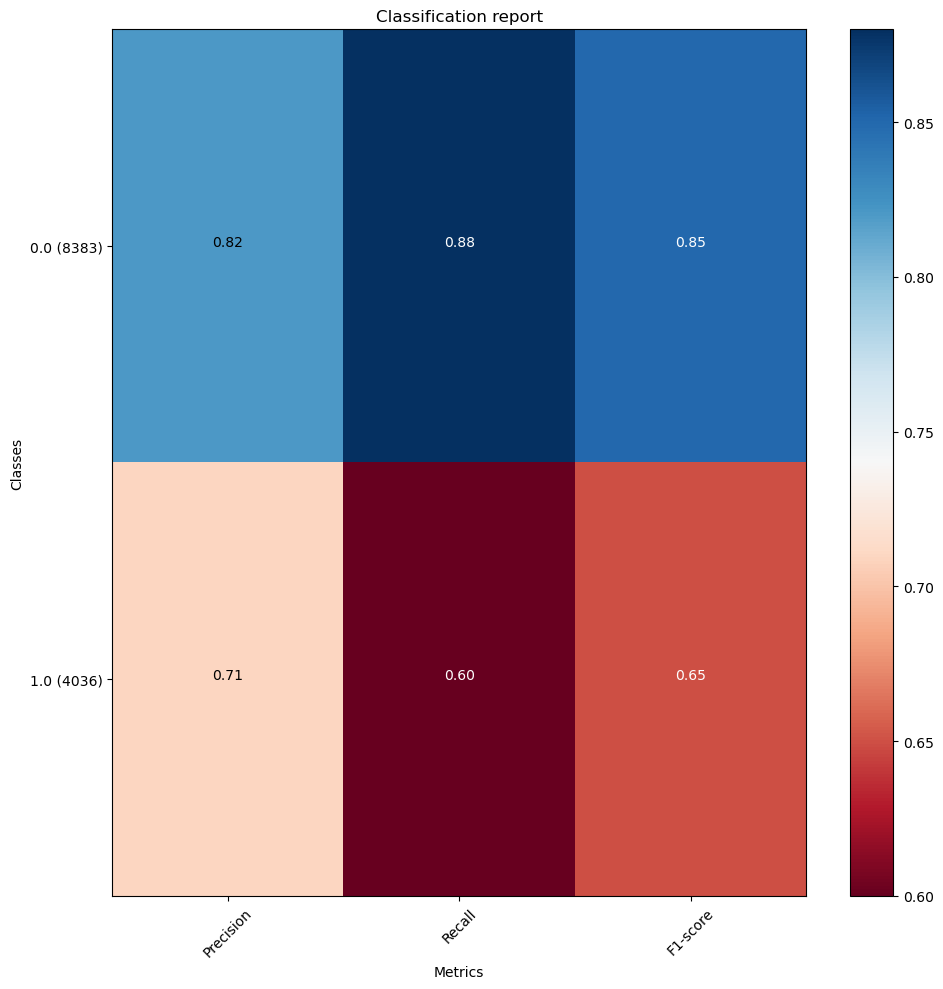

In [21]:
lgb_best = study.best_params
model = lgb.LGBMClassifier(**lgb_best)
model.fit(X_train, train_y_label)
y_pred = model.predict(X_test)
clf =classification_report(valid_y_label, y_pred)
plot_classification_report(clf)
print(clf)

# **XGB**

In [22]:
import xgboost as xgb

train_y_label = y_train
valid_y_label = y_test
train_x_tr, valid_x_es, train_y_tr, valid_y_es = train_test_split(X_train, train_y_label, test_size=0.2)

dtrain = xgb.DMatrix(train_x_tr, label=train_y_tr)
dtest = xgb.DMatrix(X_test, label=valid_y_label)

def objective(trial):

    param = {
        "verbosity": 0,
        "objective": "multi:softmax",
        "num_class": 5,
        # use exact for small dataset.
        "tree_method": "exact",
        # defines booster, gblinear for linear functions.
        "booster": trial.suggest_categorical("booster", ["gbtree", "gblinear", "dart"]),
        # L2 regularization weight.
        "lambda": trial.suggest_float("lambda", 1e-8, 1.0, log=True),
        # L1 regularization weight.
        "alpha": trial.suggest_float("alpha", 1e-8, 1.0, log=True),
        # sampling ratio for training data.
        "subsample": trial.suggest_float("subsample", 0.2, 1.0),
        # sampling according to each tree.
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.2, 1.0),
        "early_stopping_rounds":200,
        "evals":([valid_x_es,valid_y_es])
    }

    if param["booster"] in ["gbtree", "dart"]:
        # maximum depth of the tree, signifies complexity of the tree.
        param["max_depth"] = trial.suggest_int("max_depth", 3, 9, step=2)
        # minimum child weight, larger the term more conservative the tree.
        param["min_child_weight"] = trial.suggest_int("min_child_weight", 2, 10)
        param["eta"] = trial.suggest_float("eta", 1e-8, 1.0, log=True)
        # defines how selective algorithm is.
        param["gamma"] = trial.suggest_float("gamma", 1e-8, 1.0, log=True)
        param["grow_policy"] = trial.suggest_categorical("grow_policy", ["depthwise", "lossguide"])

    if param["booster"] == "dart":
        param["sample_type"] = trial.suggest_categorical("sample_type", ["uniform", "weighted"])
        param["normalize_type"] = trial.suggest_categorical("normalize_type", ["tree", "forest"])
        param["rate_drop"] = trial.suggest_float("rate_drop", 1e-8, 1.0, log=True)
        param["skip_drop"] = trial.suggest_float("skip_drop", 1e-8, 1.0, log=True)

    bst = xgb.train(param, dtrain)
    preds = bst.predict(dtest)
    pred_labels = np.rint(preds)
    accuracy = sklearn.metrics.accuracy_score(valid_y_label, pred_labels)
    return accuracy

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=50, timeout=600)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-23 12:19:55,456] A new study created in memory with name: no-name-8f9c6999-1fcf-4f51-922a-4b854827efae
[I 2024-03-23 12:19:55,609] Trial 0 finished with value: 0.7350028182623399 and parameters: {'booster': 'gblinear', 'lambda': 4.195224405504455e-06, 'alpha': 5.301086895323534e-06, 'subsample': 0.30619997611635014, 'colsample_bytree': 0.35122706770921025}. Best is trial 0 with value: 0.7350028182623399.
[I 2024-03-23 12:19:55,980] Trial 1 finished with value: 0.7854094532571061 and parameters: {'booster': 'gbtree', 'lambda': 0.5285307397190964, 'alpha': 9.158771510346187e-08, 'subsample': 0.9162793187526912, 'colsample_bytree': 0.8229582142857577, 'max_depth': 5, 'min_child_weight': 10, 'eta': 0.1774438839671223, 'gamma': 2.145127179211282e-07, 'grow_policy': 'lossguide'}. Best is trial 1 with value: 0.7854094532571061.
[I 2024-03-23 12:19:56,494] Trial 2 finished with value: 0.7737337949915453 and parameters: {'booster': 'gbtree', 'lambda': 1.4720673448126222e-05, 'alpha':

Number of finished trials: 50
Best trial:
  Value: 0.7889524116273452
  Params: 
    booster: gbtree
    lambda: 0.000691620512757772
    alpha: 0.021271630989196315
    subsample: 0.7390636286230182
    colsample_bytree: 0.9563352068328718
    max_depth: 7
    min_child_weight: 7
    eta: 0.24353861942516405
    gamma: 7.02600369058546e-08
    grow_policy: lossguide


/opt/conda/lib/python3.7/site-packages/xgboost/sklearn.py:797: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  UserWarning,


              precision    recall  f1-score   support

         0.0       0.82      0.87      0.85      8383
         1.0       0.70      0.61      0.65      4036

    accuracy                           0.79     12419
   macro avg       0.76      0.74      0.75     12419
weighted avg       0.78      0.79      0.78     12419



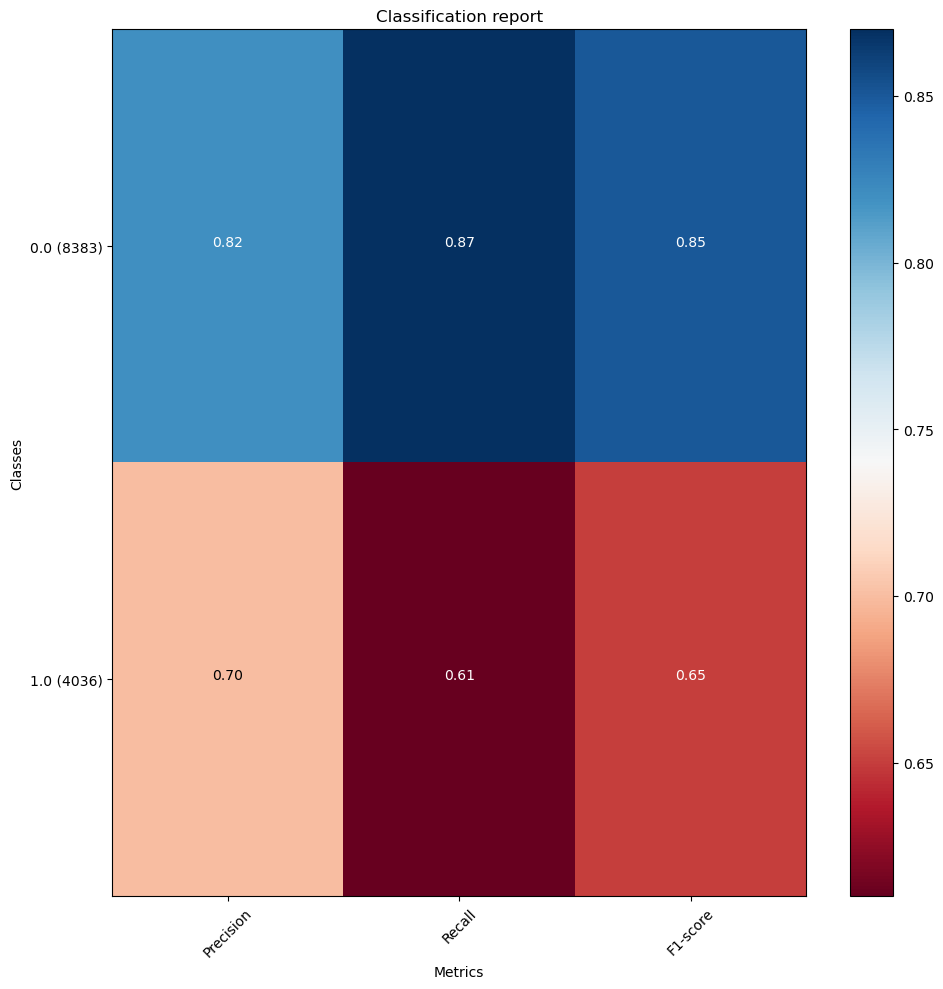

In [23]:
xgb_best = study.best_params
model = xgb.XGBClassifier(**xgb_best)
model.fit(train_x_tr,train_y_tr,eval_set=[(valid_x_es,valid_y_es)],early_stopping_rounds=200,verbose=False)
y_pred = model.predict(X_test)
clf =classification_report(valid_y_label, y_pred)
plot_classification_report(clf)
print(clf)

# **Compare ensemble**

In [24]:
# compare ensemble to each baseline classifier
from numpy import mean
from numpy import std
import pandas as pd
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import StackingClassifier
from matplotlib import pyplot
 
# get a stacking ensemble of models
def get_stacking():
    # define the base models
    level0 = list()
    level0.append(('svc', sklearn.svm.SVC(C=svc_c, gamma="auto")))
    level0.append(('ct', catboost.CatBoostClassifier(**ct_best)))
    level0.append(('lgb', lgb.LGBMClassifier(**lgb_best)))
    level0.append(('xgb', xgb.XGBClassifier(**xgb_best)))
    # define meta learner model
    level1 = LogisticRegression(max_iter=4000)
    # define the stacking ensemble
    model = StackingClassifier(estimators=level0, final_estimator=level1, cv=5)
    return model

In [25]:
# get a list of models to evaluate
def get_models():
    models = dict()
    models['svc'] = sklearn.svm.SVC(C=svc_c, gamma="auto")
    models['ct'] = catboost.CatBoostClassifier(**ct_best)
    models['lgb'] = lgb.LGBMClassifier(**lgb_best)
    models['xgb'] = xgb.XGBClassifier(**xgb_best)
    models['stacking'] = get_stacking()
    return models

In [26]:
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    return scores

>svc 0.728 (0.008)
0:	learn: 0.6747249	total: 10ms	remaining: 9.12s
1:	learn: 0.6581415	total: 19.5ms	remaining: 8.88s
2:	learn: 0.6428813	total: 28.9ms	remaining: 8.77s
3:	learn: 0.6285517	total: 38.6ms	remaining: 8.78s
4:	learn: 0.6154006	total: 47.9ms	remaining: 8.7s
5:	learn: 0.6033916	total: 57.2ms	remaining: 8.65s
6:	learn: 0.5924120	total: 66.5ms	remaining: 8.6s
7:	learn: 0.5828848	total: 75.8ms	remaining: 8.57s
8:	learn: 0.5741672	total: 85.5ms	remaining: 8.59s
9:	learn: 0.5656245	total: 95.4ms	remaining: 8.61s
10:	learn: 0.5584169	total: 105ms	remaining: 8.61s
11:	learn: 0.5514711	total: 114ms	remaining: 8.59s
12:	learn: 0.5452379	total: 124ms	remaining: 8.58s
13:	learn: 0.5389722	total: 133ms	remaining: 8.55s
14:	learn: 0.5335872	total: 142ms	remaining: 8.52s
15:	learn: 0.5283287	total: 151ms	remaining: 8.49s
16:	learn: 0.5237698	total: 162ms	remaining: 8.53s
17:	learn: 0.5194254	total: 175ms	remaining: 8.71s
18:	learn: 0.5155331	total: 195ms	remaining: 9.18s
19:	learn: 0.512

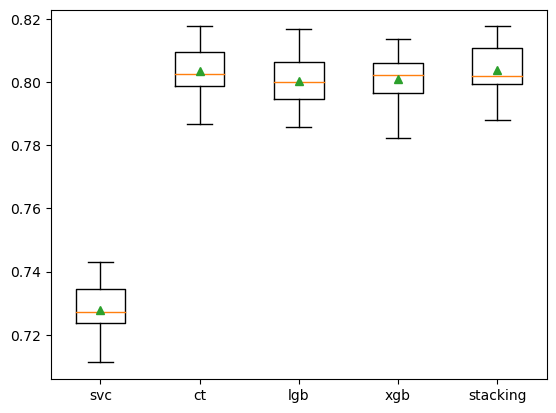

In [27]:
models = get_models()
# evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
    scores = evaluate_model(model, X, y)
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
# plot model performance for comparison
pyplot.boxplot(results, labels=names, showmeans=True)
pyplot.show()

In [28]:
level0 = list()
level0.append(('svc', sklearn.svm.SVC(C=svc_c, gamma="auto")))
level0.append(('ct', catboost.CatBoostClassifier(**ct_best)))
level0.append(('lgb', lgb.LGBMClassifier(**lgb_best)))
level0.append(('xgb', xgb.XGBClassifier(**xgb_best)))
# define meta learner model
level1 = LogisticRegression(max_iter=4000)
# define the stacking ensemble
model = StackingClassifier(estimators=level0, final_estimator=level1, cv=5)
model.fit(X, y)

0:	learn: 0.6743744	total: 8.96ms	remaining: 8.17s
1:	learn: 0.6573170	total: 18.5ms	remaining: 8.43s
2:	learn: 0.6420386	total: 27.6ms	remaining: 8.38s
3:	learn: 0.6277523	total: 36.7ms	remaining: 8.33s
4:	learn: 0.6146078	total: 46.6ms	remaining: 8.46s
5:	learn: 0.6027841	total: 56.4ms	remaining: 8.53s
6:	learn: 0.5926457	total: 66ms	remaining: 8.55s
7:	learn: 0.5831927	total: 75.4ms	remaining: 8.53s
8:	learn: 0.5744985	total: 86ms	remaining: 8.64s
9:	learn: 0.5666160	total: 95.4ms	remaining: 8.61s
10:	learn: 0.5585312	total: 105ms	remaining: 8.61s
11:	learn: 0.5513022	total: 114ms	remaining: 8.58s
12:	learn: 0.5451200	total: 124ms	remaining: 8.59s
13:	learn: 0.5388161	total: 134ms	remaining: 8.58s
14:	learn: 0.5330566	total: 143ms	remaining: 8.56s
15:	learn: 0.5279858	total: 152ms	remaining: 8.54s
16:	learn: 0.5235532	total: 162ms	remaining: 8.53s
17:	learn: 0.5193138	total: 171ms	remaining: 8.51s
18:	learn: 0.5154457	total: 180ms	remaining: 8.48s
19:	learn: 0.5116749	total: 190ms	r

StackingClassifier(cv=5,
                   estimators=[('svc', SVC(C=1.0795388931882082, gamma='auto')),
                               ('ct',
                                <catboost.core.CatBoostClassifier object at 0x7f1fe01ae290>),
                               ('lgb',
                                LGBMClassifier(bagging_fraction=0.711290977934606,
                                               bagging_freq=6,
                                               feature_fraction=0.48852642704191435,
                                               lambda_l1=0.7986843498044502,
                                               lambda_l2=0.9312527343168427,
                                               min_child_samples=11,
                                               num_leaves=232)...
                                              importance_type=None,
                                              interaction_constraints=None,
                                              lambda=0.0006

# **Make a prediction**

In [29]:
y_test = model.predict_proba(test)
sub['booking_status'] = y_test
sub.to_csv('submission.csv', index=False)